<a href="https://colab.research.google.com/github/CodeAjay/test/blob/main/Dogs_vs_Cats.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Cat Vs Dog Classification
##Download Dataset

dog=1, cat=0

In [1]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

--2023-09-26 17:22:49--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 104.117.233.21, 2600:1409:9800:893::317f, 2600:1409:9800:88a::317f
Connecting to download.microsoft.com (download.microsoft.com)|104.117.233.21|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M   176MB/s    in 5.4s    

2023-09-26 17:22:54 (147 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



##Unzip the dataset


In [2]:
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

# New Section

##Import the Modules


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import tqdm
import random
from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

## Create Dataframe for input and output


In [4]:
input_path=[]
label=[]

for class_name in os.listdir("PetImages"):
  for path in os.listdir("PetImages/"+class_name):
    if class_name=="Cat":
      label.append(0)
    else:
      label.append(1)
    input_path.append(os.path.join("PetImages",class_name,path))

print(input_path[0],label[0])

PetImages/Dog/7223.jpg 1


In [5]:
df=pd.DataFrame()
df['images']=input_path
df['label']=label
df=df.sample(frac=1).reset_index(drop=True)
df.head()

,images,label
0,PetImages/Dog/5057.jpg,1
1,PetImages/Dog/2478.jpg,1
2,PetImages/Dog/6149.jpg,1
3,PetImages/Dog/4664.jpg,1
4,PetImages/Dog/6883.jpg,1


In [6]:
for i in df['images']:
  if'.jpg' not in i:
    print(i)

PetImages/Dog/Thumbs.db
PetImages/Cat/Thumbs.db


In [7]:
#delete db files


df=df[df['images']!='PetImages/Dog/Thubs.db']
df=df[df['images']!='PetImages/Cat/Thubs.db']
len(df)

25002

In [8]:
import PIL
l=[]
for image in df['images']:

  try:
    img=PIL.Image.open(image)
  except:
    l.append(image)
l

['PetImages/Dog/11702.jpg',
 'PetImages/Cat/666.jpg',
 'PetImages/Dog/Thumbs.db',
 'PetImages/Cat/Thumbs.db']

In [22]:

df=df[df['images']!='PetImages/Dog/Thubs.db']
df=df[df['images']!='PetImages/Cat/Thubs.db']
df=df[df['images']!='PetImages/Cat/666.jpg']
df=df[df['images']!='PetImages/Dog/11702.jpg']
len(df)

25000

In [23]:
#input split

from sklearn.model_selection import train_test_split
train, test=train_test_split(df,test_size=0.2, random_state=42)

In [24]:
test.head()
# train.head()

,images,label
6870,PetImages/Dog/5593.jpg,1
24018,PetImages/Dog/1469.jpg,1
9670,PetImages/Dog/8988.jpg,1
13642,PetImages/Cat/2296.jpg,0
14020,PetImages/Cat/10661.jpg,0


##Exploratory Data Analysis

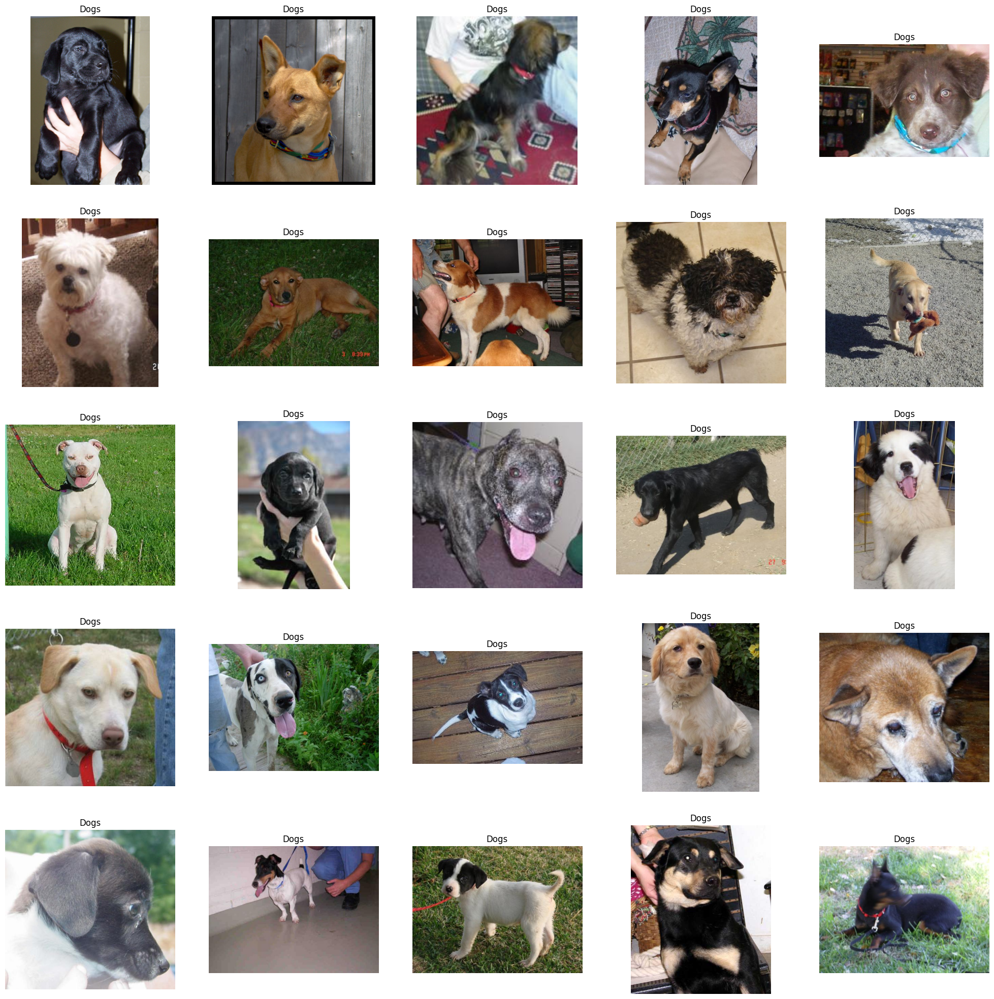

In [12]:
#to display grid of images
plt.figure(figsize=(25,25))
tmp=df[df['label']==1]['images']
start = random.randint(0, len(tmp))
files=tmp[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5,index+1)
  img=load_img(file)
  img=np.array(img)
  plt.imshow(img)
  plt.title('Dogs')
  plt.axis('off')

##For showing cats Images


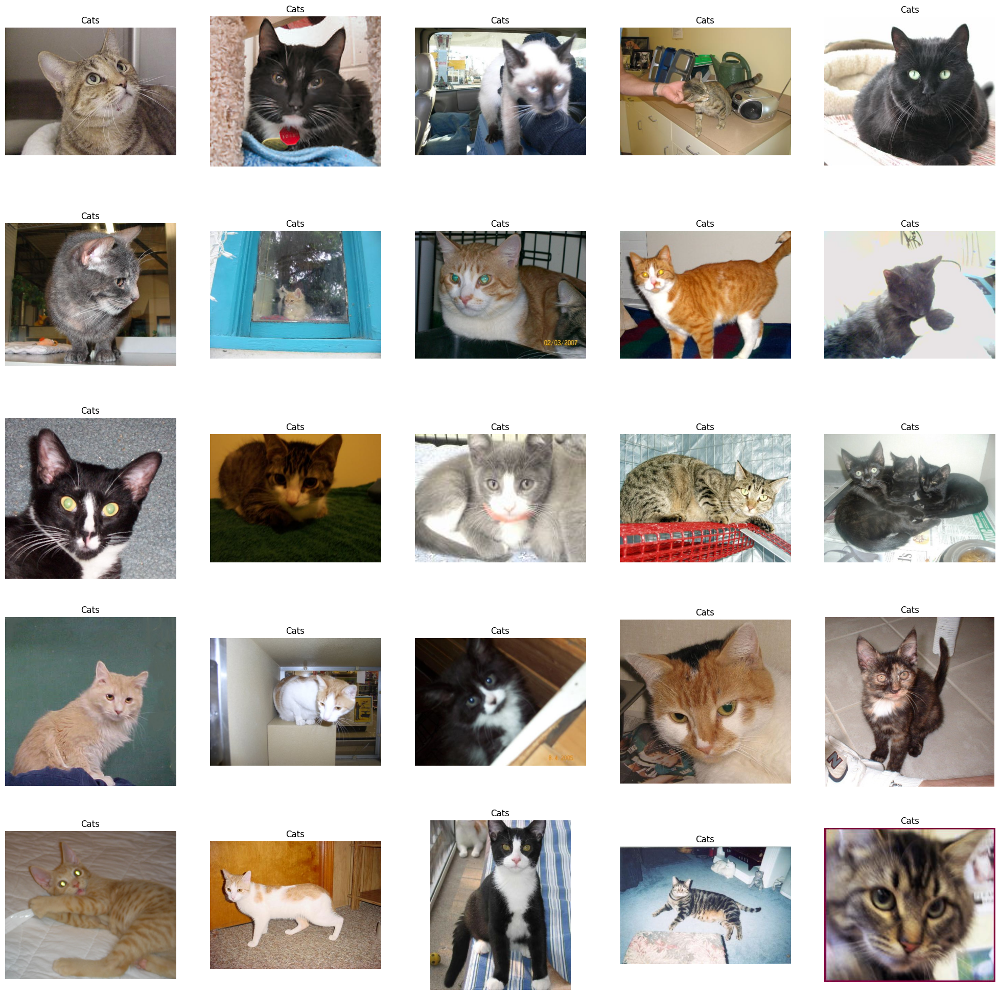

In [13]:
#to display grid of images
plt.figure(figsize=(25,25))
tmp=df[df['label']==0]['images']
start = random.randint(0, len(tmp))
files=tmp[start:start+25]

for index, file in enumerate(files):
  plt.subplot(5,5,index+1)
  img=load_img(file)
  img=np.array(img)
  plt.imshow(img)
  plt.title('Cats')
  plt.axis('off')

##

<Axes: ylabel='count'>

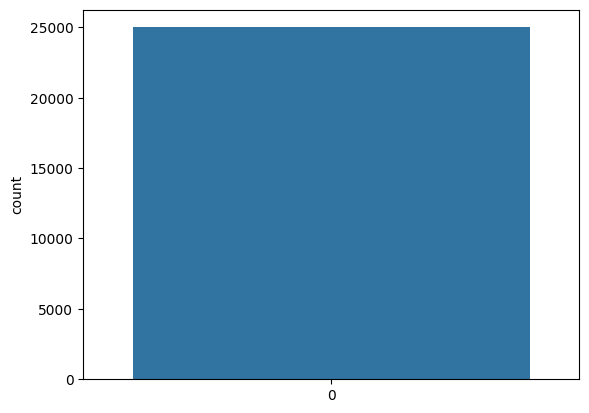

In [14]:
import seaborn as sns
sns.countplot(df['label'])

In [19]:
df['label']=df['label'].astype('str')

In [20]:
df.head()

,images,label
0,PetImages/Dog/5057.jpg,1
1,PetImages/Dog/2478.jpg,1
2,PetImages/Dog/6149.jpg,1
3,PetImages/Dog/4664.jpg,1
4,PetImages/Dog/6883.jpg,1


##Create Data Generator for Images

In [25]:
from keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale=1./255, #normalization of images
    rotation_range=40, #augmentation of images to avoid overfitting
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

val_generator =ImageDataGenerator(rescale=1./255)

train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

Found 19999 validated image filenames belonging to 2 classes.
Found 4999 validated image filenames belonging to 2 classes.


##Model Creation


In [26]:
from keras.src.backend import flatten
from keras import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense


model = Sequential([
    Conv2D(16,(3,3),activation='relu', input_shape=(128,128,3)),
    MaxPool2D((2,2)),
    Conv2D(32,(3,3),activation='relu'),
    MaxPool2D((2,2)),
    Conv2D(32,(3,3),activation='relu'),
    MaxPool2D((2,2)),
    Flatten(),
    Dense(512,activation='relu'),
    Dense(1,activation='sigmoid')
])



In [27]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics='accuracy')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 63, 63, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 30, 30, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 32)        9248      
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 14, 14, 32)        0

##Model Training


In [28]:
history = model.fit(train_iterator, epochs=5, validation_data=val_iterator)

Epoch 1/5
40/40 [==============================] - 125s 3s/step - loss: 0.7059 - accuracy: 0.5511 - val_loss: 0.6570 - val_accuracy: 0.5981
Epoch 2/5
40/40 [==============================] - 115s 3s/step - loss: 0.6410 - accuracy: 0.6353 - val_loss: 0.5984 - val_accuracy: 0.6869
Epoch 3/5
40/40 [==============================] - 112s 3s/step - loss: 0.6028 - accuracy: 0.6721 - val_loss: 0.6228 - val_accuracy: 0.6461
Epoch 4/5
40/40 [==============================] - 113s 3s/step - loss: 0.5895 - accuracy: 0.6819 - val_loss: 0.5338 - val_accuracy: 0.7349
Epoch 5/5
40/40 [==============================] - 113s 3s/step - loss: 0.5558 - accuracy: 0.7087 - val_loss: 0.5379 - val_accuracy: 0.7259


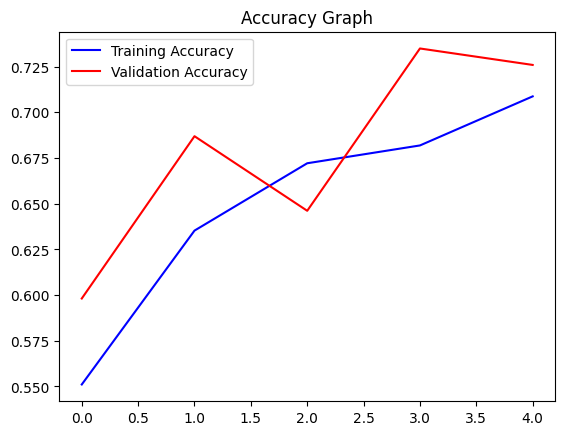

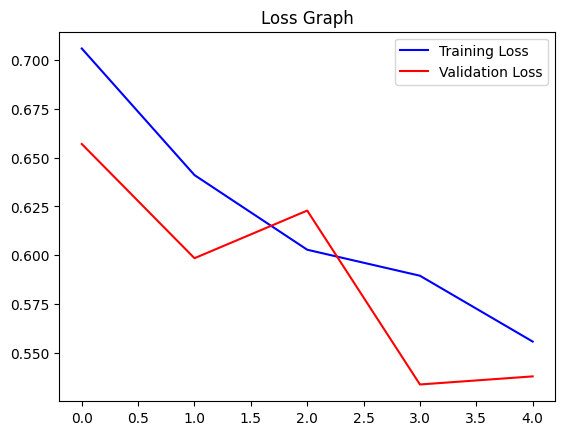

In [29]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss=history.history['val_loss']

plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

In [39]:
model.save('test.h5')

1/1 [==============================] - 0s 18ms/step


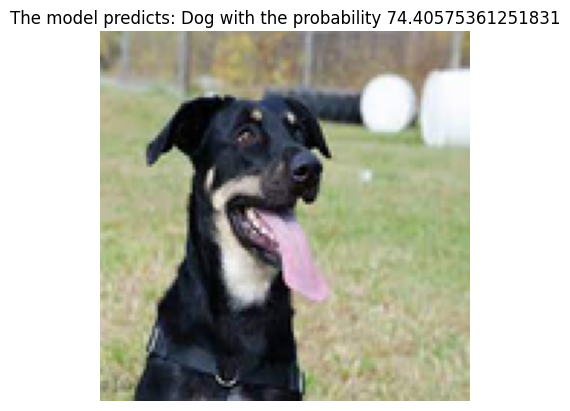

In [64]:
# import tensorflow as tf
# from tensorflow.keras.preprocessing.image import load_img, img_to_array
# import numpy as np

# # Load your pre-trained model
# # model = tf.keras.models.load_model('your_model.h5')

# # Load and preprocess your custom image
# custom_image_path = 'PetImages/test/1.jpeg'
# custom_image = load_img(custom_image_path, target_size=(255, 255))  # Resize the image to match the model's input size
# custom_image = img_to_array(custom_image) / 255.0  # Normalize pixel values to [0, 1]
# custom_image = np.expand_dims(custom_image, axis=0)  # Add batch dimension

# # Make predictions
# predictions = model.predict(custom_image)

# # Post-process predictions (e.g., get the class with the highest probability)
# predicted_class = np.argmax(predictions)

# # You can map the predicted class index to class labels if you have a class mapping
# class_labels = ['cat', 'dog']
# predicted_label = class_labels[predicted_class]

# print(f'The model predicts that the image contains a {predicted_label}.')



# import tensorflow as tf
# from tensorflow.keras.preprocessing.image import load_img, img_to_array
# import numpy as np

# # Load your pre-trained model
# # model = tf.keras.models.load_model('your_model.h5')

# # Load and preprocess your custom image
# custom_image_path = 'PetImages/test/1.jpeg'
# custom_image = load_img(custom_image_path, target_size=(255, 255))  # Resize the image to match the model's input size
# custom_image = img_to_array(custom_image) / 255.0  # Normalize pixel values to [0, 1]
# custom_image = np.expand_dims(custom_image, axis=0)  # Add batch dimension

# # Check the shape of the custom_image to ensure it matches the model's input shape
# print(f"Custom image shape: {custom_image.shape}")

# # Make predictions
# predictions = model.predict(custom_image)

# # Post-process predictions (e.g., get the class with the highest probability)
# predicted_class = np.argmax(predictions)

# # You can map the predicted class index to class labels if you have a class mapping
# class_labels = ['cat', 'dog']
# predicted_label = class_labels[predicted_class]

# print(f'The model predicts that the image contains a {predicted_label}.')


# Import necessary libraries
import numpy as np
from PIL import Image
import tensorflow as tf

# Load the pre-trained model
# model = tf.keras.models.load_model('your_model.h5')

# Load and preprocess the custom image
custom_image_path = 'PetImages/test/15.jpeg'
custom_image = Image.open(custom_image_path)

# Resize the custom image while preserving the aspect ratio
target_size = (128, 128)
custom_image = custom_image.resize(target_size, Image.ANTIALIAS)

# Convert the resized image to a NumPy array and normalize pixel values
custom_image = np.array(custom_image) / 255.0

# Add batch dimension if needed (for single-image prediction)
custom_image = np.expand_dims(custom_image, axis=0)

# Make predictions
predictions = model.predict(custom_image)

# Post-process predictions as needed
# For example, if it's a binary classification model:
if predictions[0][0] > 0.5:
    result = 'Dog'
else:
    result = 'Cat'

# print(f'The model predicts: {result}')

# Display the image
plt.imshow(custom_image[0])
plt.title(f'The model predicts: {result} with the probability {predictions[0][0]*100}')
plt.axis('off')  # Turn off axis labels
plt.show()
